## CHARGEMENT ET PRETRAITEMENT DES DONNEES

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


### Import des bibliotheques

In [ ]:
import torch
from torch import nn
import numpy as np
import random

device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)

# Reproducibilité
def set_seed(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed()

cuda


### DIVISION EN TRAIN ET TEST SETS

In [ ]:
import os
import shutil
from pathlib import Path

# Dossier source (là où sont tes 3 dossiers de classes)
src_dir = Path("/content/drive/MyDrive/Projet Pytorch/Projet 2/images_V2")

# Pourcentage pour l'entraînement
train_ratio = 0.8  # 80% train, 20% test

# Création des sous-dossiers train/test
for split in ['train', 'test']:
    split_dir = src_dir / split
    split_dir.mkdir(exist_ok=True)

# Liste des classes (dossiers)
classes = [d for d in os.listdir(src_dir) if (src_dir / d).is_dir() and d not in ['train', 'test']]

for class_name in classes:
    class_path = src_dir / class_name
    images = [f for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.jpeg'))]
    random.shuffle(images)

    split_idx = int(len(images) * train_ratio)
    train_imgs = images[:split_idx]
    test_imgs = images[split_idx:]

    # Crée les dossiers cibles
    train_class_dir = src_dir / 'train' / class_name
    test_class_dir = src_dir / 'test' / class_name
    train_class_dir.mkdir(parents=True, exist_ok=True)
    test_class_dir.mkdir(parents=True, exist_ok=True)

    # Copie les fichiers
    for img in train_imgs:
        shutil.copy(class_path / img, train_class_dir / img)
    for img in test_imgs:
        shutil.copy(class_path / img, test_class_dir / img)

    print(f"{class_name}: {len(train_imgs)} train / {len(test_imgs)} test")

print("\n Division terminée !")



 Division terminée !


Au prealable nous avons dezippe notre dossiers et renommer les differentes classes en local avant de les rajouter dans le drive. Ici on cree les dossiers train et test s'il n'existe pas et on copie les images pour chaque classe (ratio de 0.8)

### Affichage des images apres separation

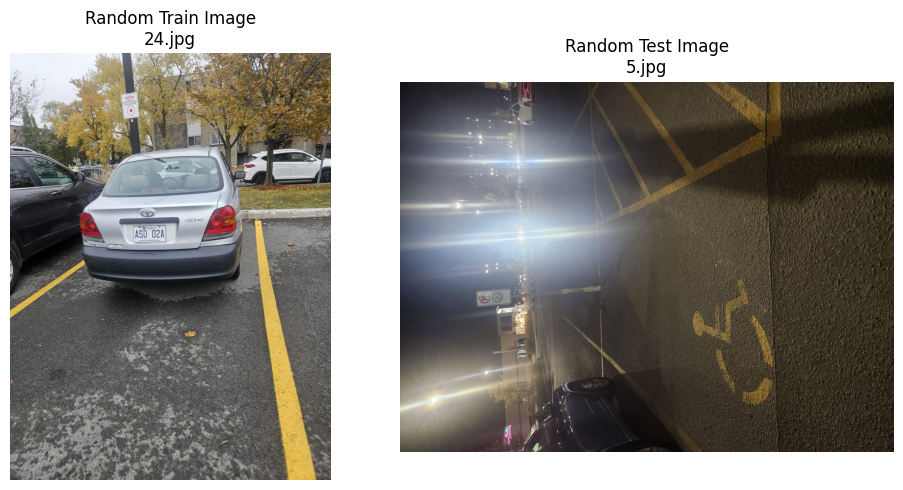

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
import os
from pathlib import Path

# Define the train and test paths
train_dir_path = Path("/content/drive/MyDrive/Projet Pytorch/Projet 2/images_V2/train")
test_dir_path = Path("/content/drive/MyDrive/Projet Pytorch/Projet 2/images_V2/test")

# Get a list of all image files in the train and test directories recursively
train_images = list(train_dir_path.rglob('*.jpg')) + list(train_dir_path.rglob('*.jpeg'))
test_images = list(test_dir_path.rglob('*.jpg')) + list(test_dir_path.rglob('*.jpeg'))


# Check if there are images in the directories
if not train_images:
    print(f"No images found in the train directory or its subfolders: {train_dir_path}")
elif not test_images:
    print(f"No images found in the test directory or its subfolders: {test_dir_path}")
else:
    # Select a random image from each directory
    random_train_img_path = random.choice(train_images)
    random_test_img_path = random.choice(test_images)

    # Load the images
    train_img = Image.open(random_train_img_path)
    test_img = Image.open(random_test_img_path)

    # Display the images
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(train_img)
    plt.title(f"Random Train Image\n{random_train_img_path.name}")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(test_img)
    plt.title(f"Random Test Image\n{random_test_img_path.name}")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

### PRETRAITEMENT DES IMAGES POUR LE SIMPLE CNN

In [ ]:
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models

# Pretraitement des images (Simple transformation)
data_transform = transforms.Compose([
    # Redimensionner a 224*224
    transforms.Resize(size=(224, 224)),
    # Convertir en Tenseur (valeurs de 0.0 à 1.0)
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.47223371267318726, 0.4646250605583191, 0.45034274458885193],
                std=[0.17290730774402618, 0.16879254579544067, 0.1701432317495346])
])

Ici nous n'avons qu'un seul pretraitement qui est le redimensionnement le but etant de comparer ce pretraitement basique aux techniques d'augmentation de donnees.

Pourquoi (224, 224) ? Nous avons essayer (64, 64) mais le resultat etait tres mauvais (accuracy) apres l'entrainement; on avait un accuracy inferieur a 30% apres 5 epochs. Cela est probablement du au fait qu'avec cette taille l'image est difficile a distinguer meme a l'oeil nu.

Avec 128x128 le resultat etait nettement meilleur mais on atteint difficilement les 50%.

Avec 224x224 nous avons les resultats observes. A preciser aussi que nous avons teste notre modele avec ces tailles et c'etait deja cette resolution la meilleure.

Nous n'avons pas essayer des tailles superieures a celle ci pour un soucis de temps mais esperons pouvoir le faire si le temps nous le permet

Les elements de normalisation (mean et std) ont ete calcluler sur le trainloader (avec juste le resize applique comme transformation). Nous avons teste le modele avec et sans normalisation et on s'est rendu compte que le score etait meilleur avec normalisation. Avant de calculer ces valeurs nous avons des valeurs aleatoires mais c'etait moins performant

### Visualisation des images apres transformations

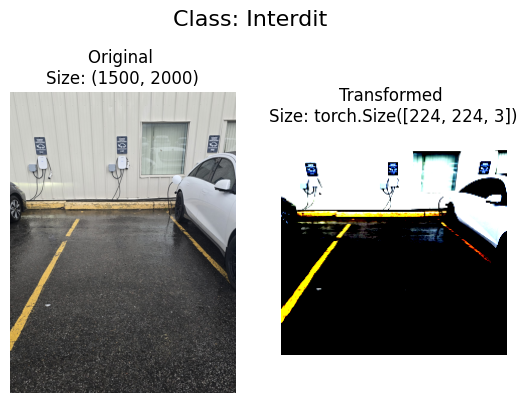

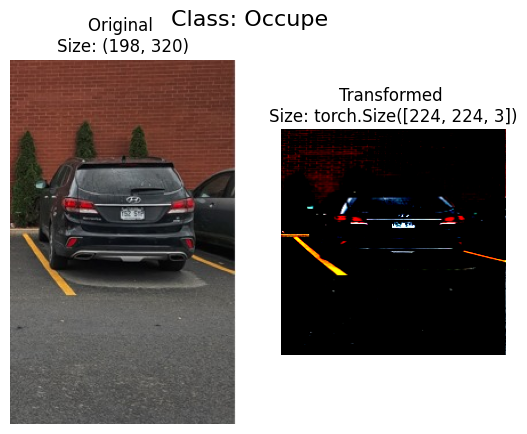

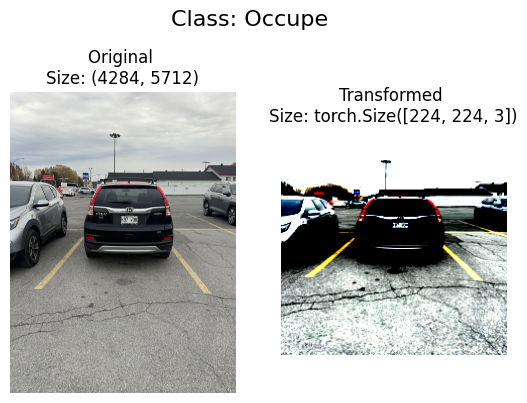

In [ ]:
def plot_transformed_images(image_paths, transform, n=3, seed=42):
    random_image_paths = random.sample(image_paths, k=n)
    for image_path in random_image_paths:
        with Image.open(image_path) as f:
            fig, ax = plt.subplots(1, 2)
            ax[0].imshow(f)
            ax[0].set_title(f"Original \nSize: {f.size}")
            ax[0].axis("off")

            # Transform and plot image
            # Note: permute() will change shape of image to suit matplotlib
            # (PyTorch default is [C, H, W] but Matplotlib is [H, W, C])
            transformed_image = transform(f).permute(1, 2, 0)
            ax[1].imshow(transformed_image)
            ax[1].set_title(f"Transformed \nSize: {transformed_image.shape}")
            ax[1].axis("off")

            fig.suptitle(f"Class: {image_path.parent.stem}", fontsize=16)

image_path_list = list(src_dir.glob("*/*/*.jpg")) +list(src_dir.glob("*/*/*.jpeg"))
plot_transformed_images(image_path_list, transform=data_transform, n=3)

Ici on observe a quoi ressembleront nos images apres application des transformations

Ci dessous nous avons le calcul des valeurs de notre normalisation. Cette partie est commentee parcequ'une fois calculer nous avons plus besoin de l'executer

In [ ]:
# dataset = ImageFolder(root=src_dir, transform=data_transform) # data_transform sans normalisation
# loader = DataLoader(dataset, batch_size=32, shuffle=False)

# mean = 0
# std = 0
# total = 0

# for images, _ in loader:
#     batch_samples = images.size(0)
#     images = images.view(batch_samples, images.size(1), -1)
#     mean += images.mean(2).sum(0)
#     std += images.std(2).sum(0)
#     total += batch_samples

# mean /= total
# std /= total

# print(f"Mean : {mean.tolist()}")
# print(f"Std  : {std.tolist()}")

### Appliquons ces transformations sur nos donnees train et test

In [ ]:
# Use ImageFolder to create dataset(s)
from torchvision import datasets
train_dir = src_dir / 'train'
test_dir = src_dir / 'test'
train_data = datasets.ImageFolder(root=train_dir,
                                  transform=data_transform,
                                  target_transform=None)

test_data = datasets.ImageFolder(root=test_dir,
                                 transform=data_transform)

print(f"Train data:\n{train_data}\nTest data:\n{test_data}")

Train data:
Dataset ImageFolder
    Number of datapoints: 931
    Root location: /content/drive/MyDrive/Projet Pytorch/Projet 2/images_V2/train
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
               Normalize(mean=[0.47223371267318726, 0.4646250605583191, 0.45034274458885193], std=[0.17290730774402618, 0.16879254579544067, 0.1701432317495346])
           )
Test data:
Dataset ImageFolder
    Number of datapoints: 234
    Root location: /content/drive/MyDrive/Projet Pytorch/Projet 2/images_V2/test
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
               Normalize(mean=[0.47223371267318726, 0.4646250605583191, 0.45034274458885193], std=[0.17290730774402618, 0.16879254579544067, 0.1701432317495346])
           )


### Verification des classes et du nombre d'images par split

In [ ]:
# Avoir une liste des classes
class_names = train_data.classes
class_names

['Interdit', 'Libre', 'Occupe']

In [ ]:
# Verification de la taille
len(train_data), len(test_data)

(931, 234)

Nous avons 931 images pour le train et 234 pour le test

In [ ]:
# Visualisation d'une image sous forme de tenseur
img, label = train_data[0][0], train_data[0][1]
print(f"Image tensor:\n{img}")
print(f"Image shape: {img.shape}")
print(f"Image datatype: {img.dtype}")
print(f"Image label: {label}")
print(f"Label datatype: {type(label)}")

Image tensor:
tensor([[[-1.8013, -1.8239, -1.8239,  ...,  0.1039,  0.1039,  0.1039],
         [-1.8013, -1.8239, -1.8013,  ...,  0.1039,  0.1039,  0.1039],
         [-1.8013, -1.8013, -1.7786,  ...,  0.1039,  0.1039,  0.1039],
         ...,
         [-2.7085, -2.7085, -2.6858,  ..., -1.8013, -1.8013, -1.8013],
         [-2.6858, -2.6858, -2.6858,  ..., -1.8466, -1.8466, -1.8013],
         [-2.6858, -2.6858, -2.6631,  ..., -1.8466, -1.8466, -1.8239]],

        [[-1.8001, -1.7769, -1.7769,  ...,  1.1040,  1.1040,  1.1040],
         [-1.8001, -1.7769, -1.7769,  ...,  1.1040,  1.1040,  1.1040],
         [-1.8001, -1.8001, -1.7769,  ...,  1.1040,  1.1040,  1.1040],
         ...,
         [-2.7062, -2.7062, -2.6829,  ..., -1.8233, -1.8233, -1.8233],
         [-2.6829, -2.6829, -2.6829,  ..., -1.8698, -1.8698, -1.8233],
         [-2.6829, -2.6829, -2.6597,  ..., -1.8698, -1.8698, -1.8466]],

        [[-1.6558, -1.6327, -1.6327,  ...,  2.3778,  2.3778,  2.3778],
         [-1.6558, -1.6558, -1.

Transformation de train et test en DataLoaders

On divise d'abord notre jeu de donnees test en deux: une partie pour la validation et une autre pour le test. Nous le faisons sur le test afin de conserver le maximum d'images pour notre entrainement. Les CNNs ont besoin d'enormement de donnees pour l'entrainement

In [ ]:
from torch.utils.data import random_split

# Definir le ratio de division
test_size = int(0.65 * len(test_data))
val_size = len(test_data) - test_size

# Division du test dataset
test_data, val_data = random_split(test_data, [test_size, val_size], generator=torch.Generator().manual_seed(42))

print(f"Size of testing data: {len(test_data)}")
print(f"Size of validation data: {len(val_data)}")

Size of testing data: 152
Size of validation data: 82


In [ ]:
# Transformer train and test Datasets en DataLoaders
train_dataloader = DataLoader(dataset=train_data,
                              batch_size=32,
                              shuffle=True)

val_dataloader = DataLoader(dataset=val_data,
                            batch_size=32,
                            shuffle=False)

test_dataloader = DataLoader(dataset=test_data,
                             batch_size=32,
                             shuffle=False)

train_dataloader, test_dataloader, val_dataloader

(<torch.utils.data.dataloader.DataLoader at 0x7ba14fa4b290>,
 <torch.utils.data.dataloader.DataLoader at 0x7ba147e7a840>)

On utilise une batch size a 32 pour un compromis duree et efficacite sur les epoques

In [ ]:
img, label = next(iter(train_dataloader))
img.shape

torch.Size([32, 3, 224, 224])

## CREATION DE NOTRE CNN SIMPLE

In [ ]:
import torch.nn.functional as F
from torch import nn

class TinyVGG(nn.Module):
    def __init__(self, num_classes=3):
        super(TinyVGG, self).__init__()

        self.features = nn.Sequential(
            # Bloc 1
            nn.Conv2d(3, 32, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 32, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),

            # Bloc 2
            nn.Conv2d(32, 64, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),

            # Bloc 3
            nn.Conv2d(64, 128, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),
        )

        # Calcul automatique de la dimension
        self.classifier = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(128 * 28 * 28, 512),  # 224/8 = 28
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

Le choix du modele n'a pas ete de tout repos deja que nous voulions un modele qui performait deja suffisamment sur les donnees initiales. Apres plusieurs entrainement nous avons remarque comment le score evoluait en fonction des parametres du modele. Avec torchinfo nous observions les parametres de chaque modele teste. Nous avons donc creer un modele (comme vous pouvez le voir ci dessous) dont le controle des parametres etaient facile. On s'est rendu compte que les modeles avec beaucoup trop de parametres et avec tres peu de parametres avaient des difficultes a generaliser. Aussi un modele trop profond ou un modele trop large a le meme probleme. Du coup nous avons essayer un modele qui resoud tous ces compromis. Certes vrai que notre modele n'est pas optimal mais il a un score que l'on peut juger acceptable

In [ ]:
# Initialisation du modèle
model_0 = TinyVGG( num_classes=len(class_names)).to(device)

model_0

TinyVGG(
  (features): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(i

In [ ]:
# class TinyVGG(nn.Module):
#     def __init__(self, input_shape: int, hidden_units: int, output_shape: int) -> None:
#         super().__init__()

#         self.conv_block_1 = nn.Sequential(
#             # 1. 1ère Conv2d
#             nn.Conv2d(in_channels=input_shape, out_channels=hidden_units, kernel_size=3, stride=1, padding=1),
#             nn.ReLU(),

#             # 2. 2ème Conv2d
#             nn.Conv2d(in_channels=hidden_units, out_channels=hidden_units, kernel_size=3, stride=1, padding=1),
#             nn.ReLU(),

#             nn.MaxPool2d(kernel_size=2, stride=2)
#         )

#         self.conv_block_2 = nn.Sequential(
#             # 1. 1ère Conv2d du bloc 2
#             nn.Conv2d(hidden_units, hidden_units, kernel_size=3, padding=1),
#             nn.ReLU(),

#             # 2. 2ème Conv2d du bloc 2
#             nn.Conv2d(hidden_units, hidden_units, kernel_size=3, padding=1),
#             nn.ReLU(),

#             nn.MaxPool2d(2)
#         )

#         self.classifier = nn.Sequential(
#             nn.Flatten(),
#             nn.Linear(in_features=hidden_units * 56 * 56,
#                       out_features=output_shape)
#         )

#     def forward(self, x: torch.Tensor):
#         return self.classifier(self.conv_block_2(self.conv_block_1(x)))

# class_names = train_data.classes

# model_0 = TinyVGG(input_shape=3, hidden_units=32, output_shape=len(class_names)).to(device)
# model_0

### Visualisation des parametres de notre modele

In [ ]:
# Install torchinfo if it's not available, import it if it is
try:
    import torchinfo
except:
    !pip install torchinfo
    import torchinfo

from torchinfo import summary
summary(model_0, input_size=[32, 3, 224, 224])

Layer (type:depth-idx)                   Output Shape              Param #
TinyVGG                                  [32, 3]                   --
├─Sequential: 1-1                        [32, 128, 28, 28]         --
│    └─Conv2d: 2-1                       [32, 32, 224, 224]        896
│    └─ReLU: 2-2                         [32, 32, 224, 224]        --
│    └─Conv2d: 2-3                       [32, 32, 224, 224]        9,248
│    └─ReLU: 2-4                         [32, 32, 224, 224]        --
│    └─MaxPool2d: 2-5                    [32, 32, 112, 112]        --
│    └─Conv2d: 2-6                       [32, 64, 112, 112]        18,496
│    └─ReLU: 2-7                         [32, 64, 112, 112]        --
│    └─Conv2d: 2-8                       [32, 64, 112, 112]        36,928
│    └─ReLU: 2-9                         [32, 64, 112, 112]        --
│    └─MaxPool2d: 2-10                   [32, 64, 56, 56]          --
│    └─Conv2d: 2-11                      [32, 128, 56, 56]         73,856

### Definition de notre earling stopping

In [ ]:
import copy

class EarlyStopping:
    def __init__(self, patience=7, min_delta=0, path='best_model.pt'):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.min_validation_loss = float('inf')
        self.path = path
        self.best_model_wts = None
        self.stop_training = False

    def check(self, validation_loss, model):
        if validation_loss < self.min_validation_loss - self.min_delta:
            # Nouvelle meilleure perte trouvée
            self.min_validation_loss = validation_loss
            self.counter = 0 # Réinitialiser le compteur
            # Sauvegarder les poids du modèle
            self.best_model_wts = copy.deepcopy(model.state_dict())
            return False
        elif validation_loss > self.min_validation_loss + self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.stop_training = True
                # Sauvegarder le meilleur modèle avant l'arrêt
                print(f"Arrêt précoce déclenché! Sauvegarde du meilleur modèle à {self.path}")
                torch.save(self.best_model_wts, self.path)
                return True
        return False

### Fonction d'entrainement

In [ ]:
from tqdm.auto import tqdm
from torch import optim

def entrainer_cnn(model, train_loader, val_loader, criterion, optimizer, num_epochs=20, patience=3, model_save_path='best_model.pt'):
    print(f"Démarrage de l'entraînement sur {device}")
    model.to(device)

    # Initialisation de l'Early Stopper
    early_stopper = EarlyStopping(patience=patience, path=model_save_path)

    # Historique pour la courbe d'apprentissage
    history = {'train_loss': [], 'val_loss': [], 'val_acc': []}

    best_acc = 0.0

    # Boucle sur toutes les époques
    for epoch in range(num_epochs):
        # --- PHASE D'ENTRAÎNEMENT ---
        model.train()
        running_loss = 0.0

        # Utilisation de tqdm pour la trace d'exécution
        train_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} (Train)", leave=False)
        for i, (images, labels) in enumerate(train_bar):
            images = images.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, labels)

            # Backward pass et optimisation
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)
            train_bar.set_postfix(loss=loss.item())

        epoch_train_loss = running_loss / len(train_loader.dataset)
        history['train_loss'].append(epoch_train_loss)

        # --- PHASE DE VALIDATION ---
        model.eval()
        running_val_loss = 0.0
        correct_predictions = 0
        total_samples = 0

        with torch.no_grad():
            # Utilisation de tqdm pour la trace d'exécution
            val_bar = tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} (Valid)", leave=False)
            for images, labels in val_bar:
                images = images.to(device)
                labels = labels.to(device)

                outputs = model(images)
                loss = criterion(outputs, labels)
                running_val_loss += loss.item() * images.size(0)

                _, predicted = torch.max(outputs.data, 1)
                correct_predictions += (predicted == labels).sum().item()
                total_samples += labels.size(0) # FIX: Add this line to update total_samples

        epoch_val_loss = running_val_loss / len(val_loader.dataset)
        epoch_val_acc = correct_predictions / total_samples

        history['val_loss'].append(epoch_val_loss)
        history['val_acc'].append(epoch_val_acc)

        print(f"Epoch {epoch+1} - Train_Loss: {epoch_train_loss:.4f} | Validation_Loss: {epoch_val_loss:.4f} | Validation_Acc: {100*epoch_val_acc:.4f}")

        # Vérification de l'arrêt précoce et sauvegarde du meilleur modèle
        early_stopper.check(epoch_val_loss, model)

        if early_stopper.stop_training:
            print("Entraînement interrompu par Early Stopping.")
            break

        if epoch_val_acc > best_acc:
            best_acc = epoch_val_acc


    # Charger les meilleurs poids enregistrés (qui ont déclenché l'arrêt)
    model.load_state_dict(early_stopper.best_model_wts)
    print(f"Entraînement terminé. Meilleure précision de validation: {best_acc:.4f}")

    plt.figure(figsize=(12, 5))

    # Courbe de Perte
    plt.subplot(1, 2, 1)
    plt.plot(history['train_loss'], label='Perte Entraînement')
    plt.plot(history['val_loss'], label='Perte Validation')
    plt.title('Courbe de Perte')
    plt.xlabel('Époque')
    plt.ylabel('Perte')
    plt.legend()

    # Courbe de Précision (Accuracy)
    plt.subplot(1, 2, 2)
    plt.plot(history['val_acc'], label='Précision Validation')
    plt.title('Courbe de Précision Validation')
    plt.xlabel('Époque')
    plt.ylabel('Précision')
    plt.legend()

    plt.show() # Affiche la fenêtre du graphique

    return model, history

### Fonction pour evaluer notre modele

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt # Added this import

def evaluer_modele(model, test_loader, classes):
    """
    Évalue un modèle PyTorch, calcule la précision et affiche une matrice de confusion.

    NOTE: La variable 'classes' est requise pour l'affichage de la heatmap.
    """
    all_labels = []
    all_preds = []
    correct = 0
    total = 0

    # Mettre le modèle en mode évaluation
    model.eval()
    device = next(model.parameters()).device # Get model device

    print("Début de l'évaluation...")

    with torch.no_grad():
        # Utilisation de tqdm pour la barre de progression
        for inputs, labels in tqdm(test_loader, desc="Progression de l'évaluation"):

            # Move data to the same device as the model
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)

            # Stocker les étiquettes et les prédictions (sur CPU pour sklearn)
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    # Calcul de la matrice de confusion
    cm = confusion_matrix(all_labels, all_preds)

    # Affichage
    plt.figure(figsize=(6, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        xticklabels=classes,
        yticklabels=classes,
        cmap='Blues'
    )
    plt.title('Matrice de Confusion')
    plt.ylabel('Classes Réelles')
    plt.xlabel('Classes Prédites')
    plt.show()

    # Calcul de la précision finale
    accuracy = 100 * correct / total
    print(f"\n Précision globale: **{accuracy:.2f}%**")

    return accuracy

### Entrainement du CNN Simple

Démarrage de l'entraînement sur cuda


Epoch 1/20 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 1/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 1 - Train_Loss: 1.0552 | Validation_Loss: 0.9320 | Validation_Acc: 58.5366


Epoch 2/20 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 2/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 2 - Train_Loss: 0.9066 | Validation_Loss: 0.8669 | Validation_Acc: 60.9756


Epoch 3/20 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 3/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 3 - Train_Loss: 0.7992 | Validation_Loss: 0.7873 | Validation_Acc: 56.0976


Epoch 4/20 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 4/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 4 - Train_Loss: 0.7723 | Validation_Loss: 0.7131 | Validation_Acc: 69.5122


Epoch 5/20 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 5/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 5 - Train_Loss: 0.6797 | Validation_Loss: 0.7474 | Validation_Acc: 68.2927


Epoch 6/20 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 6/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 6 - Train_Loss: 0.6222 | Validation_Loss: 0.6447 | Validation_Acc: 62.1951


Epoch 7/20 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 7/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 7 - Train_Loss: 0.5559 | Validation_Loss: 0.6819 | Validation_Acc: 67.0732


Epoch 8/20 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 8/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 8 - Train_Loss: 0.5295 | Validation_Loss: 0.6406 | Validation_Acc: 65.8537


Epoch 9/20 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 9/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 9 - Train_Loss: 0.4730 | Validation_Loss: 0.6058 | Validation_Acc: 67.0732


Epoch 10/20 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 10/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 10 - Train_Loss: 0.4566 | Validation_Loss: 0.6334 | Validation_Acc: 64.6341


Epoch 11/20 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 11/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 11 - Train_Loss: 0.4163 | Validation_Loss: 0.6409 | Validation_Acc: 71.9512


Epoch 12/20 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 12/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 12 - Train_Loss: 0.3660 | Validation_Loss: 0.5751 | Validation_Acc: 70.7317


Epoch 13/20 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 13/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 13 - Train_Loss: 0.3452 | Validation_Loss: 0.7022 | Validation_Acc: 75.6098


Epoch 14/20 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 14/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 14 - Train_Loss: 0.3144 | Validation_Loss: 0.5895 | Validation_Acc: 74.3902


Epoch 15/20 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 15/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 15 - Train_Loss: 0.2473 | Validation_Loss: 0.6400 | Validation_Acc: 71.9512


Epoch 16/20 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 16/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 16 - Train_Loss: 0.2372 | Validation_Loss: 0.6952 | Validation_Acc: 70.7317


Epoch 17/20 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 17/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 17 - Train_Loss: 0.1913 | Validation_Loss: 0.6561 | Validation_Acc: 70.7317
Arrêt précoce déclenché! Sauvegarde du meilleur modèle à /content/drive/MyDrive/Projet Pytorch/Projet 2/SimpleCNN-copy.pt
Entraînement interrompu par Early Stopping.
Entraînement terminé. Meilleure précision de validation: 0.7561


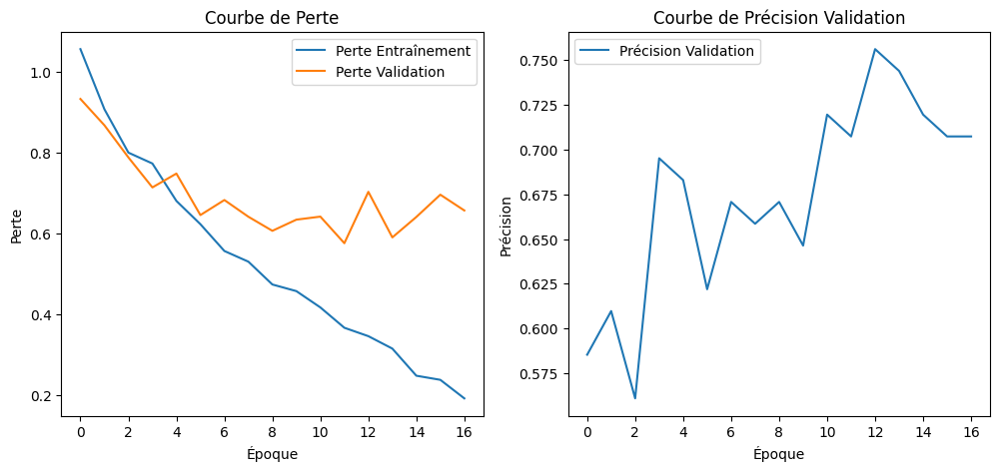

In [ ]:
# 1. Instanciation
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model_0.parameters(), lr=0.0001)
PATH = "/content/drive/MyDrive/Projet Pytorch/Projet 2/SimpleCNN-copy.pt"

model_0, history = entrainer_cnn(model_0, train_dataloader, val_dataloader, criterion, optimizer, num_epochs=20, patience=5, model_save_path=PATH)

On entraine notre modele sur 20 epoques avec une patience de 5 epoques pour le earling stopping. Le choix du lr s'est egalement apres trois essaie et le controle sur le resultat de l'entrainement sur 5 epoques. Nous avons essaye 0.1, 0.001 et 0.0001 et finalement c'est le lr=0.0001 que nous avons choisi.

A l'entrainement la meilleure precision de validation est de 0.7561 et cela peut s'observer sur la courbe de precision validation. Et c'est le modele qui a atteint ce score qui a ete sauvegarder et qui sera reutiliser pour notre evaluation sur le test. Notre courbe de perte nous permet egalement de visualiser qu'il n'y a pas de surapprentissage

### Evaluation du CNN Simple apres entrainement

Début de l'évaluation...


Progression de l'évaluation:   0%|          | 0/5 [00:00<?, ?it/s]

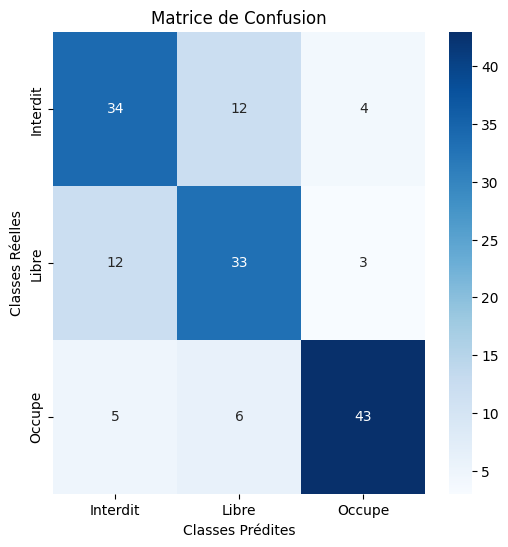


 Précision globale: **72.37%**


72.36842105263158

In [ ]:
# Evaluer le modele sur les donnees d'entrainement
model_0.load_state_dict(torch.load(PATH))
evaluer_modele(model=model_0, test_loader=test_dataloader, classes=class_names)

On se rend compte que la precision globale a l'evaluation est de 72.37% pas tres proche de la meilleure precision de validation donc on peut pourrait penser ne generalise pas suffisamment ou alors que dependant de la quantite de donnees le score pourrait different c'est meilleur ou pire

Sur la classe Ocuupe le modele fait 11 erreurs (6 interdits et 5 libres)

Pour Libre il fait 15 erreurs (12 interdit et 3 occupe)

Pour Interdit il fait 16 erreurs (16 libre et 4 occupe)

Avec ses stats on peut directement voir que modele predit mieux la classe occupe et des difficultes a distingue certaines images des classes libre et interdit

### Precision par classe

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt # Import matplotlib

def accuracy_par_classe(model, test_loader, classes):
    model.eval()
    device = next(model.parameters()).device
    y_true, y_pred = [], []

    with torch.no_grad():
        for x, y in test_loader:
            x = x.to(device); y = y.to(device)
            p = model(x).argmax(1)
            y_true += y.cpu().tolist()
            y_pred += p.cpu().tolist()

    rep = classification_report(y_true, y_pred,
                                target_names=classes, # Pass the classes list here
                                output_dict=True, zero_division=0)

    print("Accuracy par classe:")
    accs = {}
    for cls in classes:
        acc = rep[cls]["recall"]   # bons / total de la classe
        accs[cls] = float(acc)
        print(f"- {cls}: {100*acc:.2f}%")
    return accs

accs = accuracy_par_classe(model_0, test_dataloader, class_names)

Accuracy par classe:
- Interdit: 68.00%
- Libre: 68.75%
- Occupe: 79.63%


In [ ]:
def accuracy_par_classe(model, test_loader, classes):
    model.eval()
    device = next(model.parameters()).device
    y_true, y_pred = [], []

    with torch.no_grad():
        for x, y in test_loader:
            x = x.to(device); y = y.to(device)
            p = model(x).argmax(1)
            y_true += y.cpu().tolist()
            y_pred += p.cpu().tolist()

    rep = classification_report(y_true, y_pred,
                                target_names=classes, # Pass the classes list here
                                output_dict=True, zero_division=0)

    print("Accuracy par classe:")
    accs = {}
    for cls in classes:
        acc = rep[cls]["recall"]   # bons / total de la classe
        accs[cls] = float(acc)
        print(f"- {cls}: {100*acc:.2f}%")
    return accs

On se rend compte que notre a plus de difficultes a predire les classes libre et interdit

In [ ]:
def accuracy_par_classe(model, test_loader, classes):
    model.eval()
    device = next(model.parameters()).device
    y_true, y_pred = [], []

    with torch.no_grad():
        for x, y in test_loader:
            x = x.to(device); y = y.to(device)
            p = model(x).argmax(1)
            y_true += y.cpu().tolist()
            y_pred += p.cpu().tolist()

    rep = classification_report(y_true, y_pred,
                                target_names=classes, # Pass the classes list here
                                output_dict=True, zero_division=0)

    print("Accuracy par classe:")
    accs = {}
    for cls in classes:
        acc = rep[cls]["recall"]   # bons / total de la classe
        accs[cls] = float(acc)
        print(f"- {cls}: {100*acc:.2f}%")
    return accs

### Visualisation de quelques predictions

In [ ]:
from typing import List, Union

def visualiser_predictions(
    test_samples: Union[List[torch.Tensor], List[float]],
    test_labels: Union[List[int], torch.Tensor],
    pred_classes: Union[List[int], torch.Tensor],
    class_names: List[str],
    nrows: int = 3,
    ncols: int = 3
):
    """
    Affiche une grille d'images de test avec leurs prédictions et leurs étiquettes réelles.

    Args:
        test_samples: Liste ou Tensor des échantillons d'images à afficher.
        test_labels: Liste ou Tensor des étiquettes réelles des échantillons.
        pred_classes: Liste ou Tensor des classes prédites par le modèle.
        class_names: Liste des noms des classes (e.g., ['Libre', 'Occupe', 'Interdit']).
        nrows: Nombre de lignes pour la grille de visualisation.
        ncols: Nombre de colonnes pour la grille de visualisation.
    """

    # Vérifier que le nombre d'échantillons est suffisant
    max_plots = min(len(test_samples), nrows * ncols)

    # Créer la figure et la grille de sous-graphiques
    plt.figure(figsize=(ncols * 3, nrows * 3))

    print(f"Affichage de {max_plots} échantillons de prédictions...")

    for i in range(max_plots):
        # Récupérer l'échantillon, l'étiquette réelle et la prédiction pour l'indice i
        sample = test_samples[i].cpu() # Move sample to CPU

        # 1. Créer un sous-graphique
        plt.subplot(nrows, ncols, i + 1)

        # 2. Afficher l'image cible
        # Permute the dimensions to [height, width, color_channels] for Matplotlib
        plt.imshow(sample.permute(1, 2, 0))


        # 3. Trouver les étiquettes en format texte
        pred_label = class_names[pred_classes[i].item()] # Use .item() to get scalar value
        truth_label = class_names[test_labels[i].item()] # Use .item() to get scalar value

        # 4. Créer le titre
        title_text = f"Pred: {pred_label} | Truth: {truth_label}"

        # 5. Changer la couleur du titre selon le résultat
        if pred_label == truth_label:
            plt.title(title_text, fontsize=10, c="g") # Texte vert si correct
        else:
            plt.title(title_text, fontsize=10, c="r") # Texte rouge si incorrect

        # Enlever les axes pour un affichage plus propre
        plt.axis(False)

    plt.tight_layout() # Ajuster l'espacement entre les graphiques
    plt.show()

Affichage de 9 échantillons de prédictions...


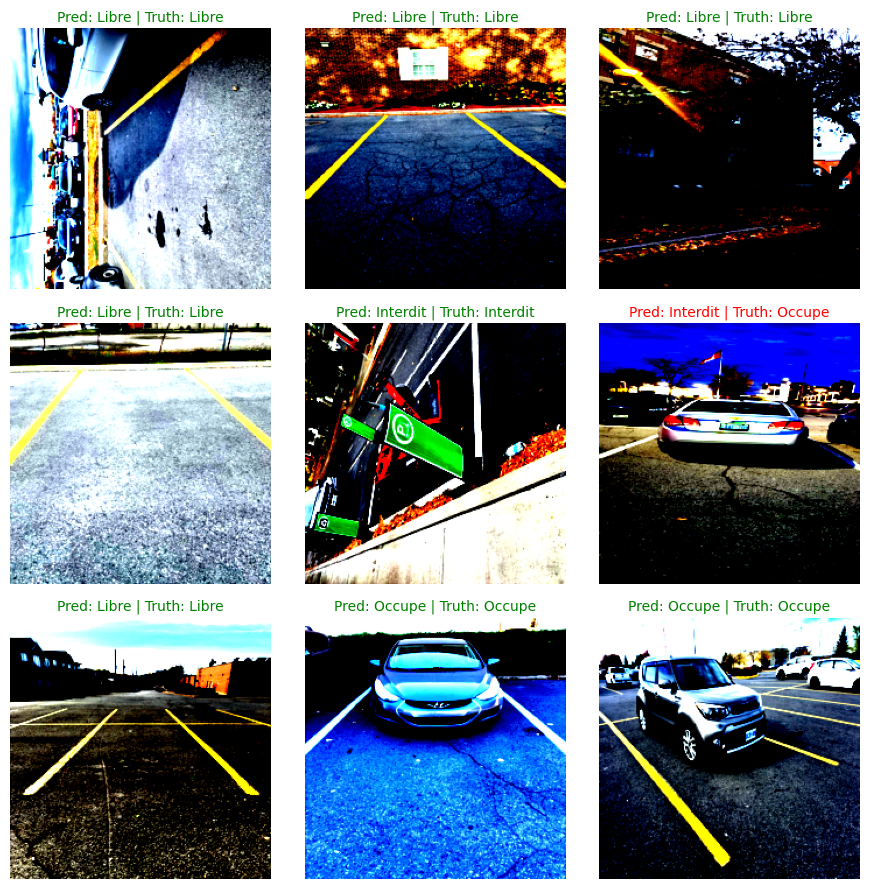

In [ ]:
test_samples, test_labels = next(iter(test_dataloader))
test_samples = test_samples.to(device)
test_labels = test_labels.to(device)
pred_classes = model_0(test_samples).argmax(1)
visualiser_predictions(test_samples, test_labels, pred_classes, class_names)

Ici nous pouvons visualiser quelques reussites et echecs de notre modele

## 1- 1ere AUGMENTATION DES DONNEES POUR SIMPLE CNN

In [ ]:
# Pipeline d'augmentation amélioré
data_transform1 = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.1),
    transforms.RandomRotation(degrees=5),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.47223371267318726, 0.4646250605583191, 0.45034274458885193],
                std=[0.17290730774402618, 0.16879254579544067, 0.1701432317495346])
])


Les transformations appliquees ici ont ete choisies de facon a ce le resultat soit differents des transformations initiales et aussi nous avons fait le choix de ne pas faire de transformations trop brusques afin de creer une augmentation toujours proches de la realite permettant d'ameliorer l'apprentissage de notre modele

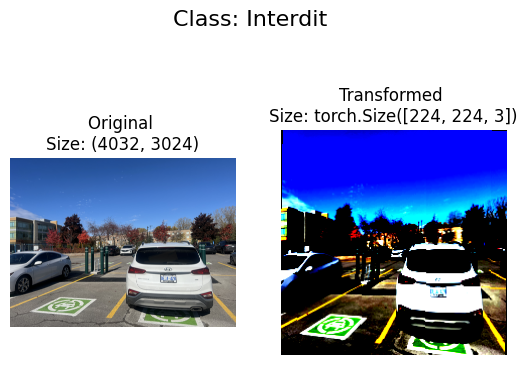

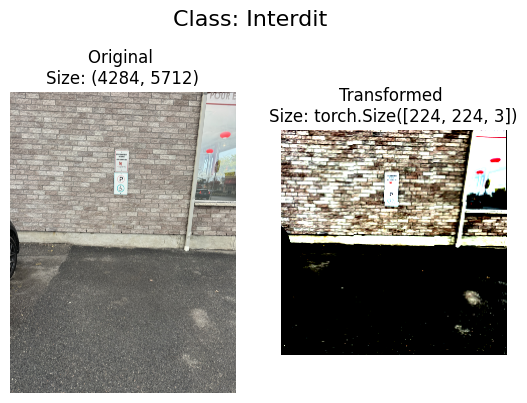

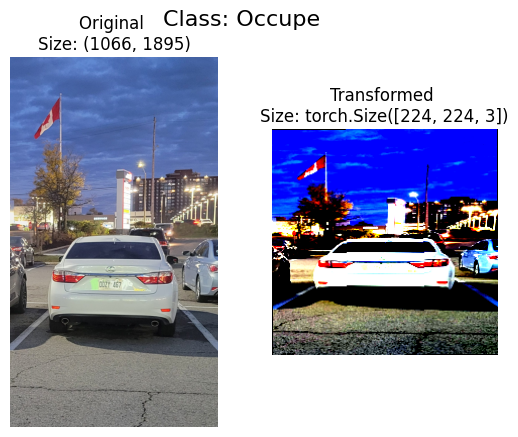

In [ ]:
# visualisation des images apres transformation
plot_transformed_images(image_path_list, transform=data_transform1, n=3)

La visualisation est faite ici par rapport aux images initiales sans transformations. Ici on peut neanmoins visualiser nos rotations et notre flip horizontal et aussi par rapport a la transformation de base les images sont moins sombres

### Application des trnasformations et augmeantation des donnees

In [ ]:
from torch.utils.data import ConcatDataset

train_data1 = datasets.ImageFolder(root=train_dir, transform=data_transform1)
train_data1 = ConcatDataset([train_data, train_data1])

print(f"Train data:\n{train_data1} - {len(train_data1)}")

Train data:
<torch.utils.data.dataset.ConcatDataset object at 0x7954dc92e150> - 1862


In [ ]:
# Transformer train and test Datasets en DataLoaders
train_dataloader1 = DataLoader(dataset=train_data1, batch_size=32, shuffle=True)
train_dataloader1

### Entrainement du SimpleCNN apres la 1ere augmentation

In [ ]:
model1 = TinyVGG(num_classes=len(class_names)).to(device)

Démarrage de l'entraînement sur cpu


Epoch 1/20 (Train):   0%|          | 0/59 [00:00<?, ?it/s]

Epoch 1/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 1 - Train_Loss: 1.0142 | Validation_Loss: 0.9305 | Validation_Acc: 46.3415


Epoch 2/20 (Train):   0%|          | 0/59 [00:00<?, ?it/s]

Epoch 2/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 2 - Train_Loss: 0.8226 | Validation_Loss: 0.8953 | Validation_Acc: 46.3415


Epoch 3/20 (Train):   0%|          | 0/59 [00:00<?, ?it/s]

Epoch 3/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 3 - Train_Loss: 0.7251 | Validation_Loss: 0.7382 | Validation_Acc: 58.5366


Epoch 4/20 (Train):   0%|          | 0/59 [00:00<?, ?it/s]

Epoch 4/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 4 - Train_Loss: 0.6674 | Validation_Loss: 0.7242 | Validation_Acc: 59.7561


Epoch 5/20 (Train):   0%|          | 0/59 [00:00<?, ?it/s]

Epoch 5/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 5 - Train_Loss: 0.6185 | Validation_Loss: 0.6838 | Validation_Acc: 64.6341


Epoch 6/20 (Train):   0%|          | 0/59 [00:00<?, ?it/s]

Epoch 6/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 6 - Train_Loss: 0.5515 | Validation_Loss: 0.6172 | Validation_Acc: 67.0732


Epoch 7/20 (Train):   0%|          | 0/59 [00:00<?, ?it/s]

Epoch 7/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 7 - Train_Loss: 0.4936 | Validation_Loss: 0.6017 | Validation_Acc: 73.1707


Epoch 8/20 (Train):   0%|          | 0/59 [00:00<?, ?it/s]

Epoch 8/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 8 - Train_Loss: 0.4815 | Validation_Loss: 0.5835 | Validation_Acc: 69.5122


Epoch 9/20 (Train):   0%|          | 0/59 [00:00<?, ?it/s]

Epoch 9/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 9 - Train_Loss: 0.4658 | Validation_Loss: 0.6121 | Validation_Acc: 73.1707


Epoch 10/20 (Train):   0%|          | 0/59 [00:00<?, ?it/s]

Epoch 10/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 10 - Train_Loss: 0.3935 | Validation_Loss: 0.5784 | Validation_Acc: 73.1707


Epoch 11/20 (Train):   0%|          | 0/59 [00:00<?, ?it/s]

Epoch 11/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 11 - Train_Loss: 0.3816 | Validation_Loss: 0.6871 | Validation_Acc: 68.2927


Epoch 12/20 (Train):   0%|          | 0/59 [00:00<?, ?it/s]

Epoch 12/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 12 - Train_Loss: 0.3491 | Validation_Loss: 0.6038 | Validation_Acc: 78.0488


Epoch 13/20 (Train):   0%|          | 0/59 [00:00<?, ?it/s]

Epoch 13/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 13 - Train_Loss: 0.2961 | Validation_Loss: 0.6526 | Validation_Acc: 80.4878
Arrêt précoce déclenché! Sauvegarde du meilleur modèle à /content/drive/MyDrive/Projet Pytorch/Projet 2/SimpleCNN-1-copy.pt
Entraînement interrompu par Early Stopping.
Entraînement terminé. Meilleure précision de validation: 0.7805


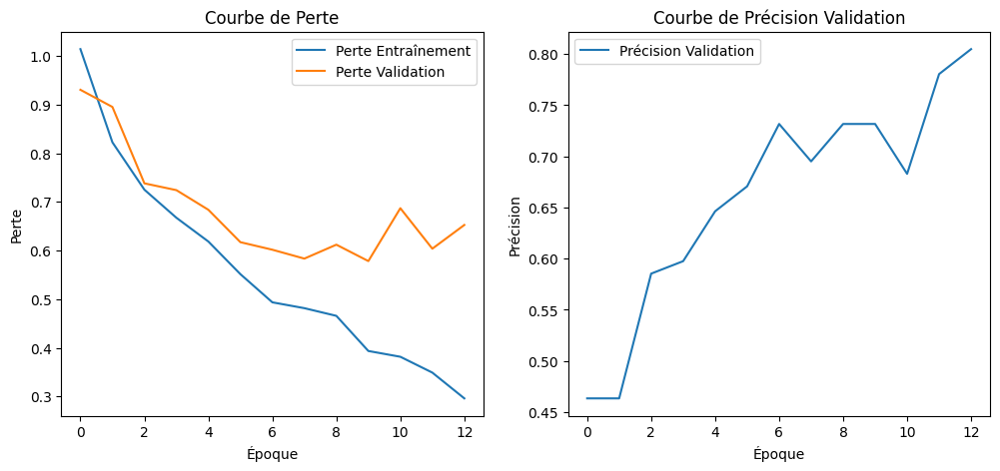

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer1 = torch.optim.Adam(model1.parameters(), lr=0.0001)
PATH = "/content/drive/MyDrive/Projet Pytorch/Projet 2/SimpleCNN-1-copy.pt"

model1, history = entrainer_cnn(model1, train_dataloader1, val_dataloader, criterion, optimizer1, num_epochs=20, patience=3, model_save_path=PATH)

On oberserve que la precision de validation est 0.78 ce qui bien plus haut que le score global du modele de base (0.72). On ne peut pas encore dire que notre augmentation des donnees a permis d'ameliorer notre score. Nous verifierons cela a l'evaluation sur les donnees test

### Evaluation du modele

Début de l'évaluation...


Progression de l'évaluation:   0%|          | 0/5 [00:00<?, ?it/s]

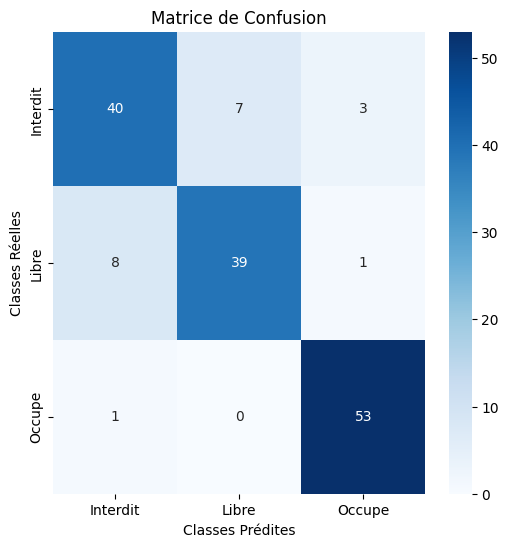


 Précision globale: **86.84%**


86.84210526315789

In [ ]:
import torch
# Evaluer le modele sur les donnees de test avec la nouvelle transformation
model1.load_state_dict(torch.load(PATH))
evaluer_modele(model=model1, test_loader=test_dataloader, classes=class_names)

La precision globale a l'evaluation est de 86.84% et on peut voir que notre modele fait beaucoup moins d'erreurs pour chaque classe par rapport a initialement et qu'il est bien plus capable de generaliser

Le modele a la meme capacite a confondre les classes libre et interdit mais le nombre d'erreurs est reduit. Avec la classe occupe le modele a un score presque parfait

En conclusion on peut dire que cette augmentation a bonifier notre modele et sur toutes les classes ce qui est quelque chose de positif

### Verification des resultats

In [ ]:
# Verification de la precision de chaque classe
accs = accuracy_par_classe(model1, test_dataloader, class_names)

Accuracy par classe:
- Interdit: 80.00%
- Libre: 81.25%
- Occupe: 98.15%


On peut observer que la precision a considerablement augmenter pour chaque classe et que le modele fait tres peu d'erreurs sur la classe occupe. Par contre la confusion des classes libre et interdit existe toujours

Affichage de 9 échantillons de prédictions...


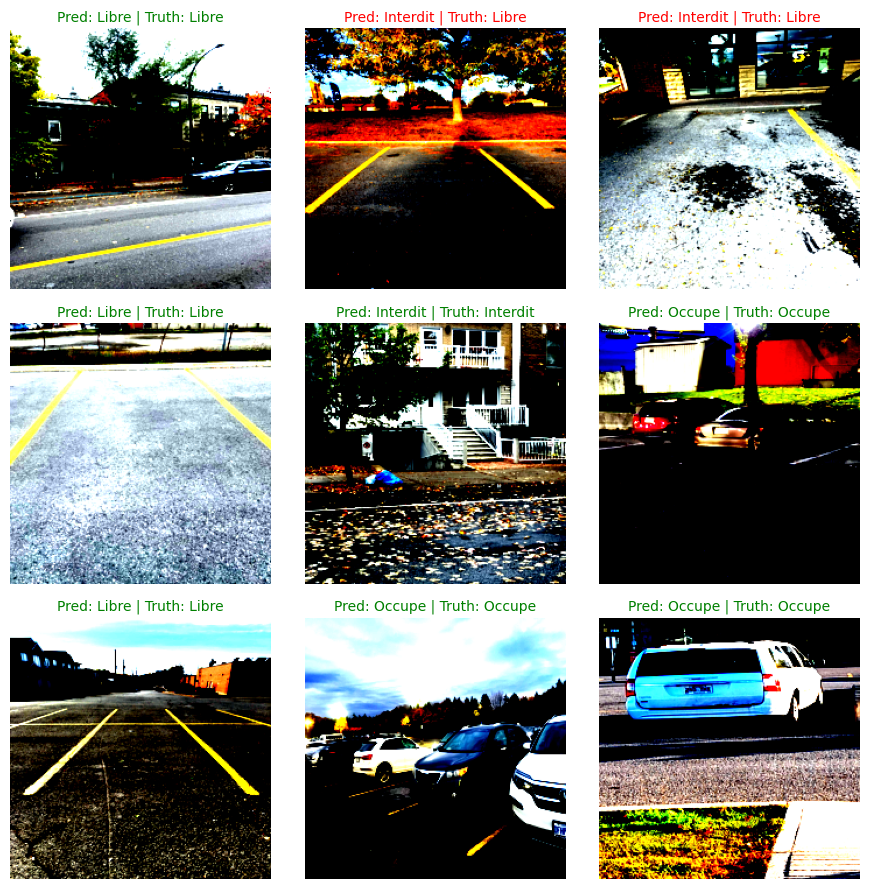

In [ ]:
# Visualisation de quelques predictions
test_samples, test_labels = next(iter(test_dataloader))
test_samples = test_samples.to(device)
test_labels = test_labels.to(device)
pred_classes = model1(test_samples).argmax(1)
visualiser_predictions(test_samples, test_labels, pred_classes, class_names)

Avec ces visualisations l'on peut tres comprendre pourquoi notre fait certaines erreurs par exemple sur la classe libre ou il fait l'erreur l'image contient une voiture et pareil pour la classe interdit predite occupe

## 2- AUGMENTATION DES DONNEES CNN

In [ ]:
data_transform2 = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop((224, 224)),
    transforms.RandomHorizontalFlip(p=0.3),
    # RandAugment
    transforms.RandAugment(num_ops=4, magnitude=7),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.47223371267318726, 0.4646250605583191, 0.45034274458885193],
                std=[0.17290730774402618, 0.16879254579544067, 0.1701432317495346])
])

Ici on applique des transformations legeres mais de maniere aleatoire. Chaque transformation est choisi aleatoirement puis est appliquee pour chaque image

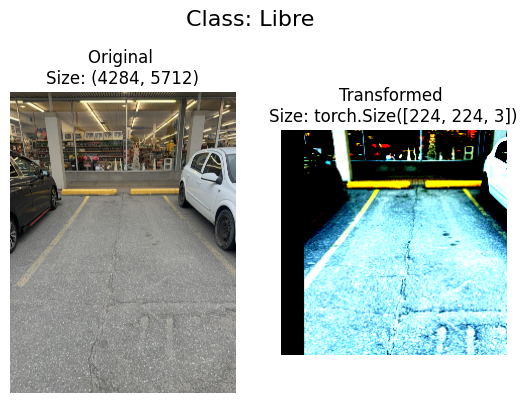

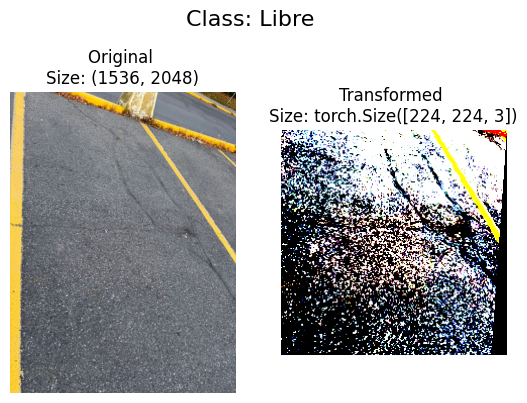

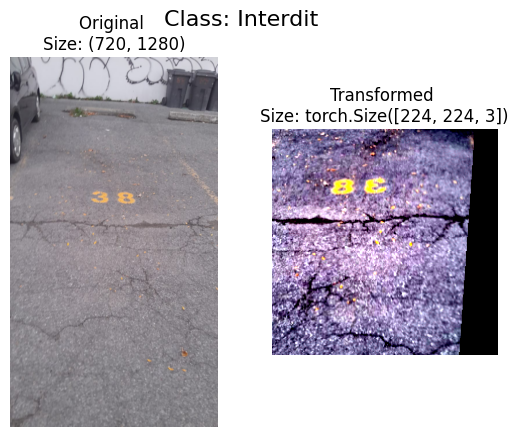

In [ ]:
# visualisation des images apres transformation
plot_transformed_images(image_path_list, transform=data_transform2, n=3)

### Donnees de la 2e augmentation
On augmente ensuite nos donnees comme a l'etape precedente

In [ ]:
train_data2 = datasets.ImageFolder(root=train_dir, transform=data_transform2, target_transform=None)
train_data2 = ConcatDataset([train_data, train_data2])
print(f"Train data:\n{train_data2}")

Train data:


In [ ]:
# Transformer train and test Datasets en DataLoaders
train_dataloader2 = DataLoader(dataset=train_data2, batch_size=32, shuffle=True)
train_dataloader2

### Entrainement du modele apres la 2e aumgmentation

Démarrage de l'entraînement sur cpu


Epoch 1/20 (Train):   0%|          | 0/59 [00:00<?, ?it/s]

Epoch 1/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 1 - Train_Loss: 1.0210 | Validation_Loss: 0.9322 | Validation_Acc: 53.6585


Epoch 2/20 (Train):   0%|          | 0/59 [00:00<?, ?it/s]

Epoch 2/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 2 - Train_Loss: 0.8899 | Validation_Loss: 0.8140 | Validation_Acc: 56.0976


Epoch 3/20 (Train):   0%|          | 0/59 [00:00<?, ?it/s]

Epoch 3/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 3 - Train_Loss: 0.8070 | Validation_Loss: 0.7723 | Validation_Acc: 54.8780


Epoch 4/20 (Train):   0%|          | 0/59 [00:00<?, ?it/s]

Epoch 4/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 4 - Train_Loss: 0.7863 | Validation_Loss: 0.7496 | Validation_Acc: 59.7561


Epoch 5/20 (Train):   0%|          | 0/59 [00:01<?, ?it/s]

Epoch 5/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 5 - Train_Loss: 0.7449 | Validation_Loss: 0.6597 | Validation_Acc: 64.6341


Epoch 6/20 (Train):   0%|          | 0/59 [00:00<?, ?it/s]

Epoch 6/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 6 - Train_Loss: 0.6845 | Validation_Loss: 0.6431 | Validation_Acc: 63.4146


Epoch 7/20 (Train):   0%|          | 0/59 [00:00<?, ?it/s]

Epoch 7/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 7 - Train_Loss: 0.6621 | Validation_Loss: 0.6352 | Validation_Acc: 69.5122


Epoch 8/20 (Train):   0%|          | 0/59 [00:00<?, ?it/s]

Epoch 8/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 8 - Train_Loss: 0.6413 | Validation_Loss: 0.6272 | Validation_Acc: 64.6341


Epoch 9/20 (Train):   0%|          | 0/59 [00:00<?, ?it/s]

Epoch 9/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 9 - Train_Loss: 0.6040 | Validation_Loss: 0.5812 | Validation_Acc: 70.7317


Epoch 10/20 (Train):   0%|          | 0/59 [00:00<?, ?it/s]

Epoch 10/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 10 - Train_Loss: 0.6107 | Validation_Loss: 0.6212 | Validation_Acc: 70.7317


Epoch 11/20 (Train):   0%|          | 0/59 [00:00<?, ?it/s]

Epoch 11/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 11 - Train_Loss: 0.6078 | Validation_Loss: 0.5975 | Validation_Acc: 73.1707


Epoch 12/20 (Train):   0%|          | 0/59 [00:00<?, ?it/s]

Epoch 12/20 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 12 - Train_Loss: 0.5569 | Validation_Loss: 0.5890 | Validation_Acc: 75.6098
Arrêt précoce déclenché! Sauvegarde du meilleur modèle à /content/drive/MyDrive/Projet Pytorch/Projet 2/SimpleCNN-2-copy.pt
Entraînement interrompu par Early Stopping.
Entraînement terminé. Meilleure précision de validation: 0.7317


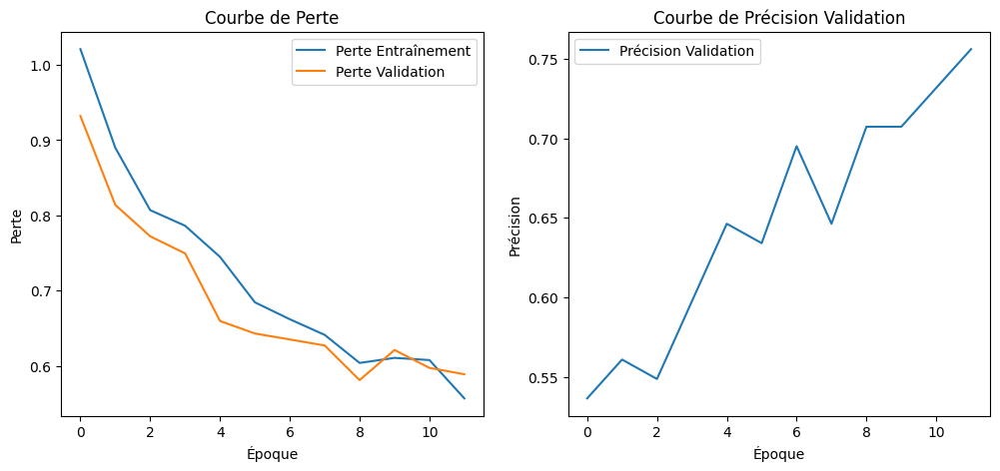

In [ ]:
model2 = TinyVGG( num_classes=len(class_names)).to(device)
PATH = "/content/drive/MyDrive/Projet Pytorch/Projet 2/SimpleCNN-2-copy.pt"
criterion = nn.CrossEntropyLoss()
optimizer2 = torch.optim.Adam(model2.parameters(), lr=0.0001)

model2, history = entrainer_cnn(model2, train_dataloader2, val_dataloader, criterion, optimizer2, num_epochs=20, patience=3, model_save_path=PATH)

Ici on voit un leger chevauchement entre la courbe de validation et de perte cela est du au fait que le modele tentait deja de surapprendre pendant l'entrainement mais notre patience fixe a 3 l'a arrete et aussi le meilleur score a la validation est 0.7317

### Evaluation du modele apres la 2e augmentation

Début de l'évaluation...


Progression de l'évaluation:   0%|          | 0/5 [00:00<?, ?it/s]

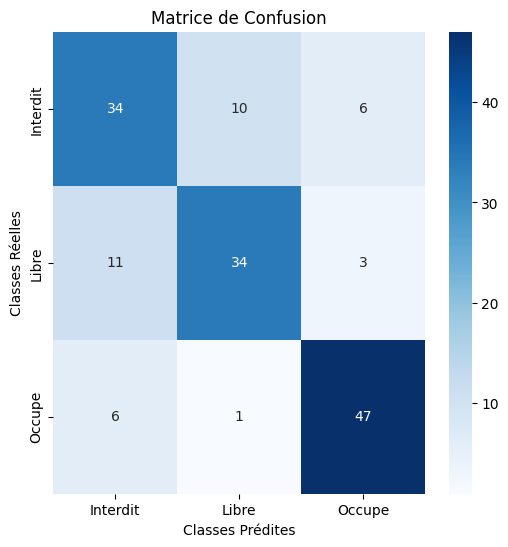


 Précision globale: **75.66%**


75.65789473684211

In [ ]:
# Evaluer le modele sur les donnees de test avec la nouvelle transformation
model2.load_state_dict(torch.load(PATH))
evaluer_modele(model=model2, test_loader=test_dataloader, classes=class_names)

La precision globale est meileure a l'evaluation par rapport a celle de l'entrainement. Aussi elle est meilleure par rapport a celle de la transformation initiale. Ce qui veut encore dire que notre reussit a generaliser et qu'il n'y a pas eu de surapprentissage

On peut donc conclure de cette partie que l'augmentation des donnees est avantageuse si elle est bien faite dans le cas contraire le modele ne s'ameliore pas.

Interrogation : Le surapprentissage est-il toujours un inconvenient ? Cette interrogation intervient car nous avons entraine un modele sans earling stopping et donnees de validation et a l'evaluation ce modele avait une precision globale superieure a 90% sur les donnees test qui etaient plus volumineux (peut etre un coup de chance)

### Visualisation des resultats

In [ ]:
# Verification de la precision de chaque classe
accs = accuracy_par_classe(model2, test_dataloader, class_names)

Accuracy par classe:
- Interdit: 68.00%
- Libre: 70.83%
- Occupe: 87.04%


Avec ces nouvelles transformations ameliorent la prediction de la classe Interdit par rapport aux transformations precedentes. Mais par les deux autres classes en sont penalisees.

Hypotheses : On pourrait peut obetenir un score encore plus optimal en combinant les transformation 1 et 2

Affichage de 9 échantillons de prédictions...


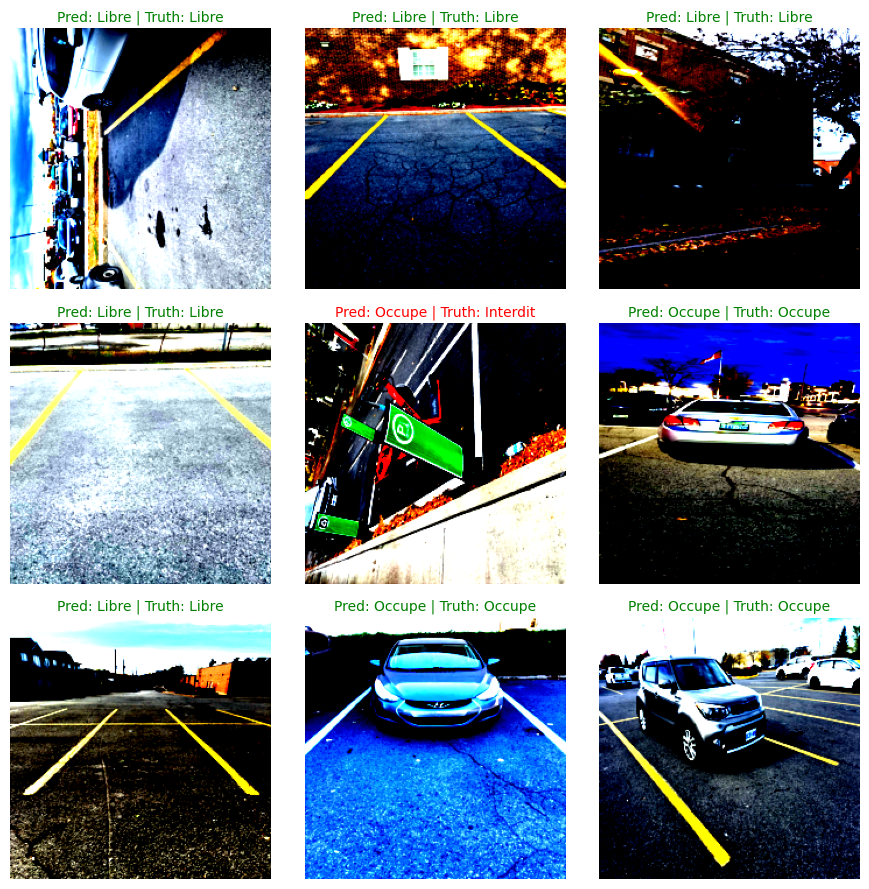

In [ ]:
# Visualisation de quelques predictions
test_samples, test_labels = next(iter(test_dataloader))
test_samples = test_samples.to(device)
test_labels = test_labels.to(device)
pred_classes = model2(test_samples).argmax(1)
visualiser_predictions(test_samples, test_labels, pred_classes, class_names)

## TRANSFERT LEARNING

### Preparation des donnees pour le trnasfert learning.

In [ ]:
# Note : L'ordre est important !
train_transform = transforms.Compose([
  # 1. redimensionner
  transforms.Resize((224, 224)),
  # 2. Retourner horizontalement (50% de chance)
  transforms.RandomHorizontalFlip(p=0.5),
  # 3. Convertir en Tenseur (valeurs de 0.0 à 1.0)
  transforms.ToTensor(),
  # 4. Normaliser (si on utilise un modèle pré-entraîné)
  transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
  )
])

test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

In [ ]:
train_data = datasets.ImageFolder(root=train_dir,
                                  transform=train_transform,
                                  target_transform=None)

test_data = datasets.ImageFolder(root=test_dir,
                                 transform=test_transform)

print(f"Train data:\n{train_data}")
print(f"Test data:\n{test_data}")

Train data:
Dataset ImageFolder
    Number of datapoints: 931
    Root location: /content/drive/MyDrive/Projet Pytorch/Projet 2/images_V2/train
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               RandomHorizontalFlip(p=0.5)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )
Test data:
Dataset ImageFolder
    Number of datapoints: 234
    Root location: /content/drive/MyDrive/Projet Pytorch/Projet 2/images_V2/test
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )


In [ ]:
test_size = int(0.65 * len(test_data))
val_size = len(test_data) - test_size

# Division du test dataset
test_data, val_data = random_split(test_data, [test_size, val_size], generator=torch.Generator().manual_seed(42))

print(f"Size of testing data: {len(test_data)}")
print(f"Size of validation data: {len(val_data)}")

Size of testing data: 152
Size of validation data: 82


On applique le train_transform sur le train et on applique le test_transform sur le test et la validation. Afin d'eviter la fuite des donnees

In [ ]:
# Transformer train and test Datasets en DataLoaders
train_dataloader3 = DataLoader(dataset=train_data, batch_size=32, shuffle=True)

val_dataloader3 = DataLoader(dataset=val_data, batch_size=32, shuffle=False)

test_dataloader3 = DataLoader(dataset=test_data, batch_size=32, shuffle=False)

Le modele utilise ici c'est google. Ce n'est certe pas le meilleur de tous mais l'avantage de ce dermier est qu'il beaucoup moins de parametres par rapport aux autres. Cela sera un avantage pour nous lors de l'entrainement qui sera probablement plus rapide

In [ ]:
model = models.googlenet(weights=models.GoogLeNet_Weights.DEFAULT)
model

Downloading: "https://download.pytorch.org/models/googlenet-1378be20.pth" to /root/.cache/torch/hub/checkpoints/googlenet-1378be20.pth


100%|██████████| 49.7M/49.7M [00:00<00:00, 175MB/s]


GoogLeNet(
  (conv1): BasicConv2d(
    (conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (conv2): BasicConv2d(
    (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): BasicConv2d(
    (conv): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (inception3a): Inception(
    (branch1): BasicConv2d(
      (conv): Conv2d(192, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track

In [ ]:
# Geler les couches du modèle pré-entraîné
for param in model.parameters():
    param.requires_grad = False

model.fc = nn.Linear(model.fc.in_features, len(class_names))
model = model.to(device)

On gele la derniere couche puis on entraine notre modele

In [ ]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
criterion = nn.CrossEntropyLoss()

Démarrage de l'entraînement sur cuda


Epoch 1/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 1/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 1 - Train_Loss: 1.1028 | Validation_Loss: 1.0525 | Validation_Acc: 47.5610


Epoch 2/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 2/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 2 - Train_Loss: 1.0410 | Validation_Loss: 1.0282 | Validation_Acc: 57.3171


Epoch 3/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 3/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 3 - Train_Loss: 1.0085 | Validation_Loss: 0.9953 | Validation_Acc: 62.1951


Epoch 4/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 4/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 4 - Train_Loss: 0.9617 | Validation_Loss: 0.9535 | Validation_Acc: 64.6341


Epoch 5/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 5/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 5 - Train_Loss: 0.9243 | Validation_Loss: 0.9248 | Validation_Acc: 60.9756


Epoch 6/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 6/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 6 - Train_Loss: 0.8928 | Validation_Loss: 0.9075 | Validation_Acc: 64.6341


Epoch 7/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 7/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 7 - Train_Loss: 0.8622 | Validation_Loss: 0.8695 | Validation_Acc: 63.4146


Epoch 8/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 8/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 8 - Train_Loss: 0.8354 | Validation_Loss: 0.8524 | Validation_Acc: 63.4146


Epoch 9/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 9/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 9 - Train_Loss: 0.8098 | Validation_Loss: 0.8429 | Validation_Acc: 62.1951


Epoch 10/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 10/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 10 - Train_Loss: 0.7903 | Validation_Loss: 0.8246 | Validation_Acc: 65.8537


Epoch 11/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 11/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 11 - Train_Loss: 0.7668 | Validation_Loss: 0.7979 | Validation_Acc: 67.0732


Epoch 12/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 12/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 12 - Train_Loss: 0.7561 | Validation_Loss: 0.8014 | Validation_Acc: 62.1951


Epoch 13/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 13/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 13 - Train_Loss: 0.7323 | Validation_Loss: 0.7832 | Validation_Acc: 64.6341


Epoch 14/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 14/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 14 - Train_Loss: 0.7244 | Validation_Loss: 0.7668 | Validation_Acc: 64.6341


Epoch 15/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 15/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 15 - Train_Loss: 0.7090 | Validation_Loss: 0.7543 | Validation_Acc: 68.2927


Epoch 16/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 16/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 16 - Train_Loss: 0.7003 | Validation_Loss: 0.7511 | Validation_Acc: 67.0732


Epoch 17/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 17/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 17 - Train_Loss: 0.6968 | Validation_Loss: 0.7358 | Validation_Acc: 68.2927


Epoch 18/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 18/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 18 - Train_Loss: 0.6653 | Validation_Loss: 0.7316 | Validation_Acc: 67.0732


Epoch 19/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 19/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 19 - Train_Loss: 0.6592 | Validation_Loss: 0.7240 | Validation_Acc: 67.0732


Epoch 20/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 20/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 20 - Train_Loss: 0.6548 | Validation_Loss: 0.7006 | Validation_Acc: 69.5122


Epoch 21/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 21/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 21 - Train_Loss: 0.6462 | Validation_Loss: 0.7155 | Validation_Acc: 69.5122


Epoch 22/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 22/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 22 - Train_Loss: 0.6311 | Validation_Loss: 0.6874 | Validation_Acc: 70.7317


Epoch 23/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 23/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 23 - Train_Loss: 0.6222 | Validation_Loss: 0.6993 | Validation_Acc: 69.5122


Epoch 24/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 24/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 24 - Train_Loss: 0.6192 | Validation_Loss: 0.7009 | Validation_Acc: 71.9512


Epoch 25/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 25/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 25 - Train_Loss: 0.6123 | Validation_Loss: 0.6897 | Validation_Acc: 69.5122
Arrêt précoce déclenché! Sauvegarde du meilleur modèle à /content/drive/MyDrive/Projet Pytorch/Projet 2/GoogleNet.pt
Entraînement interrompu par Early Stopping.
Entraînement terminé. Meilleure précision de validation: 0.7195


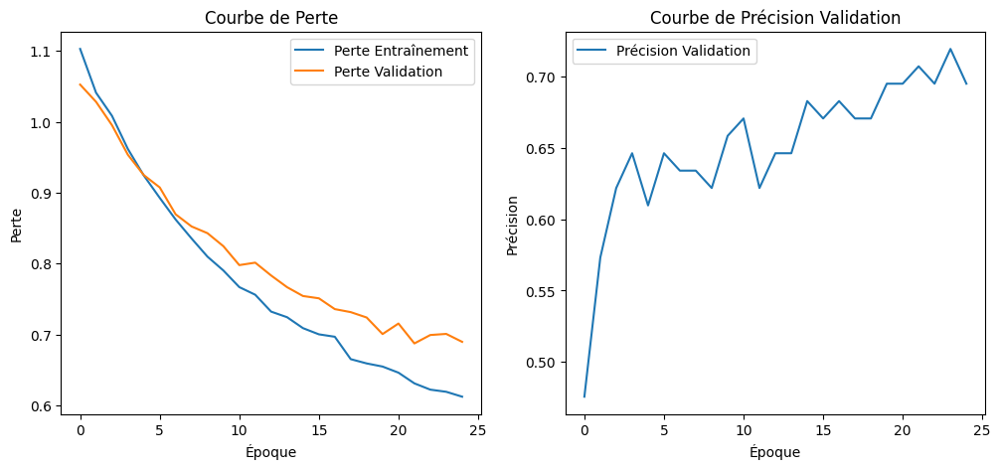

In [ ]:
PATH = "/content/drive/MyDrive/Projet Pytorch/Projet 2/GoogleNet.pt"

model, history = entrainer_cnn(model, train_dataloader3, val_dataloader3,  criterion, optimizer, num_epochs=30,  patience=3, model_save_path=PATH)

Début de l'évaluation...


Progression de l'évaluation:   0%|          | 0/5 [00:00<?, ?it/s]

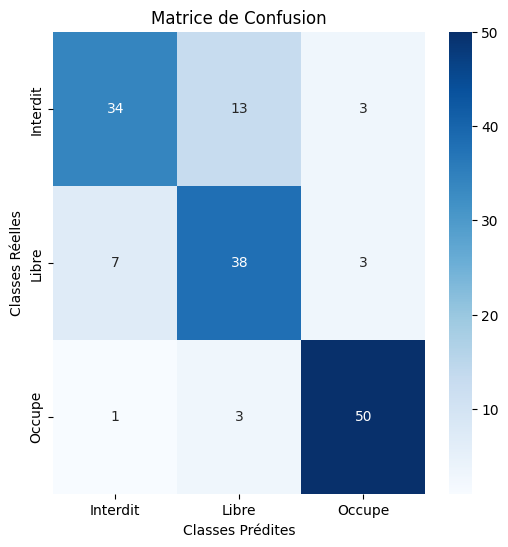


 Précision globale: **80.26%**


80.26315789473684

In [ ]:
evaluer_modele(model=model, test_loader=test_dataloader3, classes=class_names)

Le score global est a 80%. Le modele a du mal a predire la classe interdit. Il confond certaines images interdites a libre. Mais le modele reussit tout de meme a tres bien generaliser car la meilleure precision de validation a 71%. Peut etre que faire certaines transformations pourraient aider le modele a mieux comprendre la classe interdit

In [ ]:
# Verification de la precision de chaque classe
accs = accuracy_par_classe(model, test_dataloader3, class_names)

Accuracy par classe:
- Interdit: 68.00%
- Libre: 79.17%
- Occupe: 92.59%


Affichage de 9 échantillons de prédictions...


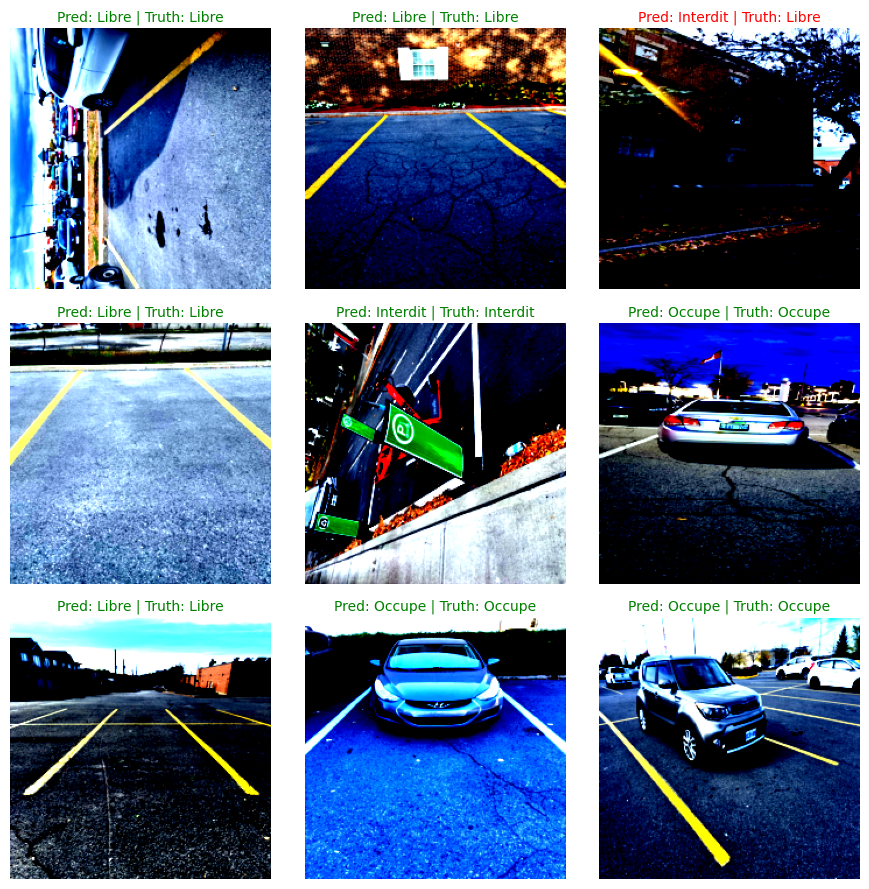

In [ ]:
# Visualisation de quelques predictions
test_samples, test_labels = next(iter(test_dataloader3))
test_samples = test_samples.to(device)
test_labels = test_labels.to(device)
pred_classes = model(test_samples).argmax(1)
visualiser_predictions(test_samples, test_labels, pred_classes, class_names)

## Fine Tuning

Ici on degele la derniere couche et la 5e couche d'inception afin d'affiner l'apprentissage de notre modele

In [ ]:
model = models.googlenet(weights=models.GoogLeNet_Weights.DEFAULT)

for param in model.parameters():
    param.requires_grad = False

model.fc = nn.Linear(model.fc.in_features, len(class_names))

# Unfreeze the final inception block (inception5b) for fine-tuning
for param in model.inception5b.parameters():
    param.requires_grad = True

model = model.to(device)

optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=0.0001
    )

Démarrage de l'entraînement sur cuda


Epoch 1/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 1/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 1 - Train_Loss: 0.8996 | Validation_Loss: 0.7157 | Validation_Acc: 69.5122


Epoch 2/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 2/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 2 - Train_Loss: 0.6236 | Validation_Loss: 0.5959 | Validation_Acc: 73.1707


Epoch 3/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 3/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 3 - Train_Loss: 0.5138 | Validation_Loss: 0.5276 | Validation_Acc: 76.8293


Epoch 4/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 4/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 4 - Train_Loss: 0.4439 | Validation_Loss: 0.5057 | Validation_Acc: 76.8293


Epoch 5/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 5/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 5 - Train_Loss: 0.4246 | Validation_Loss: 0.4959 | Validation_Acc: 71.9512


Epoch 6/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 6/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 6 - Train_Loss: 0.3835 | Validation_Loss: 0.4744 | Validation_Acc: 76.8293


Epoch 7/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 7/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 7 - Train_Loss: 0.3611 | Validation_Loss: 0.4491 | Validation_Acc: 78.0488


Epoch 8/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 8/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 8 - Train_Loss: 0.3304 | Validation_Loss: 0.4369 | Validation_Acc: 79.2683


Epoch 9/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 9/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 9 - Train_Loss: 0.3245 | Validation_Loss: 0.4202 | Validation_Acc: 81.7073


Epoch 10/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 10/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 10 - Train_Loss: 0.2926 | Validation_Loss: 0.4367 | Validation_Acc: 78.0488


Epoch 11/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 11/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 11 - Train_Loss: 0.2743 | Validation_Loss: 0.4114 | Validation_Acc: 81.7073


Epoch 12/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 12/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 12 - Train_Loss: 0.2469 | Validation_Loss: 0.4019 | Validation_Acc: 85.3659


Epoch 13/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 13/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 13 - Train_Loss: 0.2446 | Validation_Loss: 0.4028 | Validation_Acc: 80.4878


Epoch 14/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 14/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 14 - Train_Loss: 0.2220 | Validation_Loss: 0.3940 | Validation_Acc: 84.1463


Epoch 15/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 15/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 15 - Train_Loss: 0.2008 | Validation_Loss: 0.4010 | Validation_Acc: 81.7073


Epoch 16/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 16/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 16 - Train_Loss: 0.1856 | Validation_Loss: 0.4054 | Validation_Acc: 79.2683


Epoch 17/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 17/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 17 - Train_Loss: 0.1676 | Validation_Loss: 0.3875 | Validation_Acc: 82.9268


Epoch 18/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 18/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 18 - Train_Loss: 0.1658 | Validation_Loss: 0.3926 | Validation_Acc: 80.4878


Epoch 19/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 19/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 19 - Train_Loss: 0.1699 | Validation_Loss: 0.4129 | Validation_Acc: 78.0488


Epoch 20/30 (Train):   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 20/30 (Valid):   0%|          | 0/3 [00:00<?, ?it/s]

Epoch 20 - Train_Loss: 0.1482 | Validation_Loss: 0.3941 | Validation_Acc: 82.9268
Arrêt précoce déclenché! Sauvegarde du meilleur modèle à /content/drive/MyDrive/Projet Pytorch/Projet 2/GoogleNet1.pt
Entraînement interrompu par Early Stopping.
Entraînement terminé. Meilleure précision de validation: 0.8537


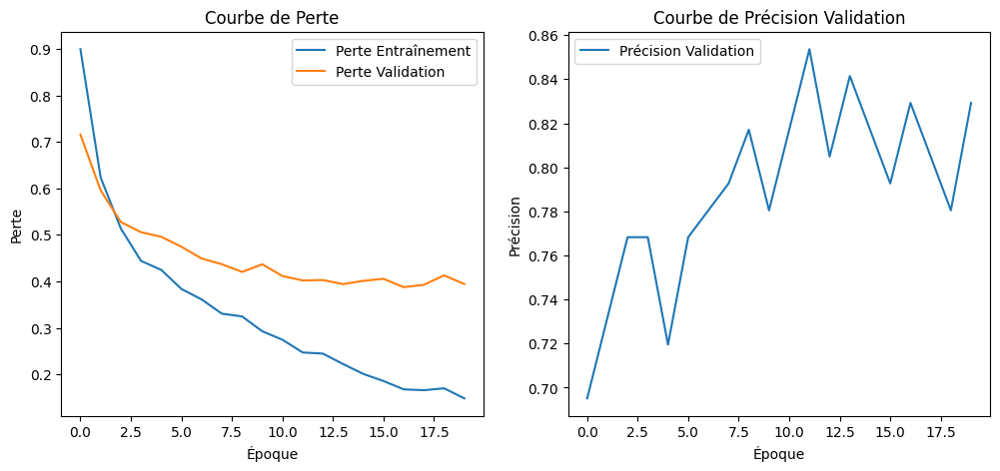

In [ ]:
PATH = "/content/drive/MyDrive/Projet Pytorch/Projet 2/GoogleNet1.pt"

model, history = entrainer_cnn( model, train_dataloader3, val_dataloader3, criterion, optimizer, num_epochs=30, patience=3, model_save_path=PATH)

Début de l'évaluation...


Progression de l'évaluation:   0%|          | 0/5 [00:00<?, ?it/s]

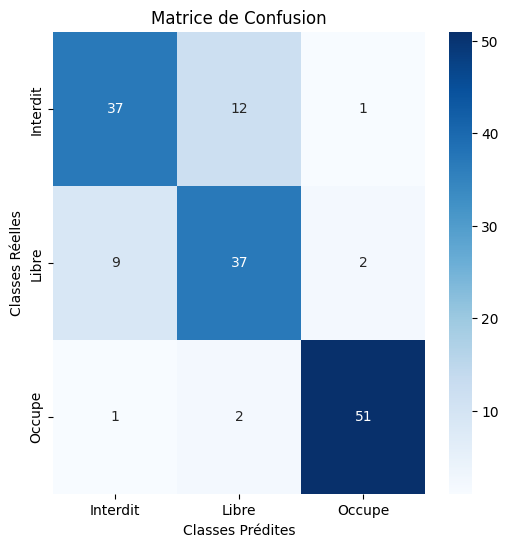


 Précision globale: **82.24%**


82.23684210526316

In [ ]:
model.load_state_dict(torch.load(PATH))
evaluer_modele(model=model, test_loader=test_dataloader3, classes=class_names)

Le score est de 82% et il y a presque un equlibre sur la prediction des classes libre et Interdit. Le fine tuning est plus optimal mais n'est pas le meilleur modele

In [ ]:
# Verification de la precision de chaque classe
accs = accuracy_par_classe(model, test_dataloader3, class_names)

Accuracy par classe:
- Interdit: 74.00%
- Libre: 77.08%
- Occupe: 94.44%


Affichage de 9 échantillons de prédictions...


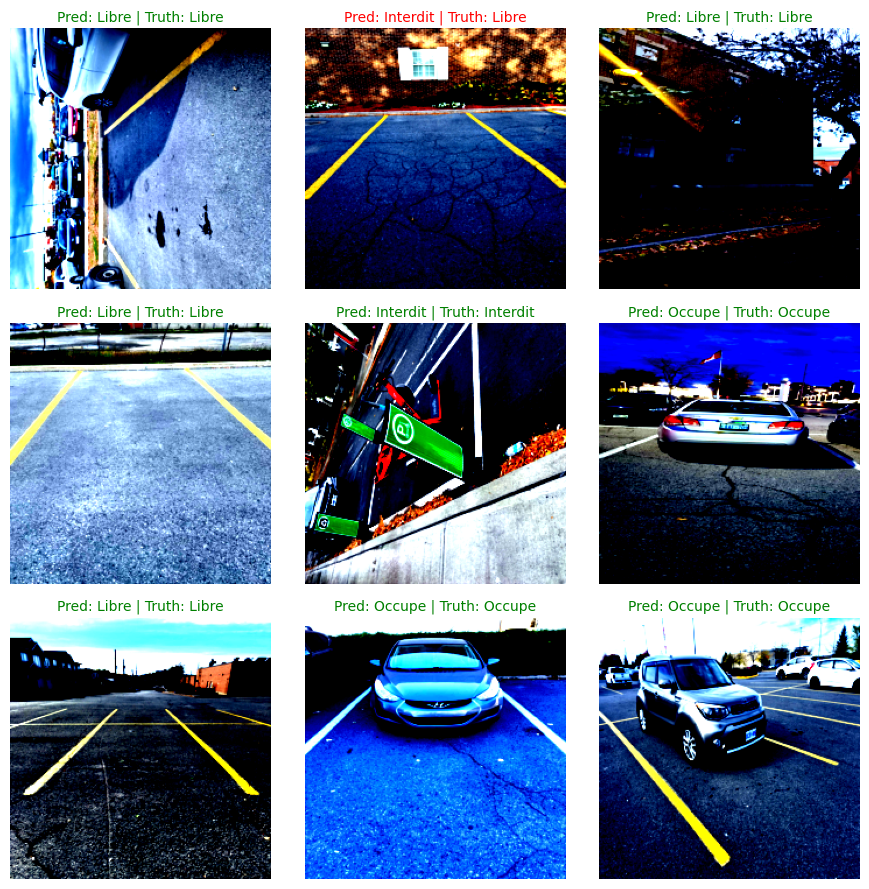

In [ ]:
# Visualisation de quelques predictions
test_samples, test_labels = next(iter(test_dataloader3))
test_samples = test_samples.to(device)
test_labels = test_labels.to(device)
pred_classes = model(test_samples).argmax(1)
visualiser_predictions(test_samples, test_labels, pred_classes, class_names)

## Comparaison des modeles

En prenant le meilleur modele de chaque etape nous allons comparer nos differents modeles. Deja le baseline et le googlenet ont ete entraines sur 931 donnees et l'on avait en moyenne 2:30s par epoque; le modele des donnees augmentees etant entraine sur le double des donnees prenait plus ou moins le double de ce temps et c'est du au fait que nous avons utilise un batchsize a 32 pour ces entrainements. Noter que ce temps c'est sur le GPU de colab. De ce fait afin de comparer nos modeles on s'est penche sur la precision et le temps(nombre d'epoques) pour dresser le tableau (trie par accuracy) suivant:

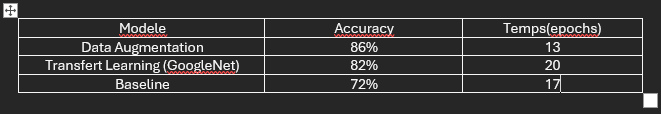

## CONCLUSION

La vision par ordinateur est une tache complexe qui demande beaucoup de rigueur et de patience. Avant de faire des choix que ce soit du modele ou des transformations nous devons nous baser sur des hypotheses, des tests et certaines connaissances au preable. Nous pouvons dire que ce projet nous a permis de mieux comprendre comment se passe la vision par ordinateur. Nous avons egalement pu observer les defis de ce domaine de l'IA ; entrainer des modeles de CNNs demande enormement de ressources materielles et humaines (temps de conception du modele), sans toutefois oublier le temps d'execution.

Enfin s'il faut recommander un modele pour ce contexte, je recommanderai le modele obtenu a la premiere augmentation des donnees. C'est pas le plus rapide en terme de temps d'apprentisage mais c'est aussi du au fait qu'il utilise plus de donnees. Pourquoi ce modele ? D'abord vu la difference entre la precision d'apprentissage et d'evaluation, on se rend compte que notre modele generalise tres bien sur les nouvelles donnees. Aussi, ne nous attardons pas que sur le fait que le modele prenne plus de temps mais examinons aussi le fait que ce modele obtient ce score sur 13 epoques.

## Remarques

On note ici que le nombre de parametres d'un modele influence enormement sur l'efficacite de ce dernier. Faut pas non plus negliger le profondeur et la largeur du modele qui sont des facteurs qui bien qu'ils influencent sur le nombre doivent etre bien choisi afin que le modele ne soit pas beaucoup trop complexe.

Nous notons que c'est pas tout type de trnasformation de donnees qui permet d'ameliorer le score du modele. Il faut choisir les augmentations en fonction par du type d'image que l'on a et bien d'autres parametres

Et enfin lors du transfert learning il est essentiel d'affiner certaines couches pour esperer obtenir un score ameliore. Cette operation permet au modele de mieux comprendre les images et affiner les poids pour une sortie optimal. Dans notre cas on s'est rendu compte le transfert learning de base avait besoin de plus de 25 epoques pour mieux apprendre par contre celui affine n'a eu besoin que de 20 epoques pour faire un meilleur score. Aussi nous avons teste resnet (hors de ce notebook) et on s'est rendu compte que ce dernier a un score bien plus eleve que l'ensemble des modeles de ce notebook et cela le fait avec un max de 10 epoques (pour le nombre de fois teste) sur les donnees initiales. Ce qui veut que resnet apprendre tres rapidement et est aussi tres efficace. Cela justifie pourquoi ce modele est celui ayant remporte le concours de ImageNet.

Nous avons particulierement utiliser googlenet dans l'espoir d'experimenter et aussi dans le but de faire quelque chose de different du cours.